# <img src="../assets/icons/EvoSeed.png" alt="EvoSeed" style="height:1em;"> Tutorial to use Stable Diffusion to generate images that can fool ResNet-50 <img src="../assets/icons/EvoSeed.png" alt="EvoSeed" class="image" style="height:1em">

### <img src="../assets/icons/imaging.png" alt="Diffusion Model" style="height:1em;"> Setup Libraries for fooling

Let's install the required libraries!

In [ ]:
%pip install cma
%pip install torch
%pip install diffusers
%pip install transformers
%pip install accelerate

In [1]:
import os 
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

Let's import all necessary libraries

In [2]:
%matplotlib inline

import numpy as np
from tqdm.auto import tqdm
from matplotlib import pyplot as plt

import cma
import torch 
import torch.distributed as dist
from torch.nn import functional as F

from torchvision import models
from diffusers import AutoPipelineForText2Image

from IPython import display

np.random.seed(1337)
torch.manual_seed(1337)

2024-06-20 18:35:19.878265: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-20 18:35:19.878352: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-20 18:35:19.879284: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-20 18:35:20.812923: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


### <img src="../assets/icons/imaging.png" alt="Diffusion Model" style="height:1em;"> Setup Stable Diffusion XL-Turbo for Image Generation 

Let's setup Stable Diffusion XL-Turbo

In [3]:
class GenerativeModel:

    def __init__(self, device="cuda:0"):
        
        self.device      = device
        
        # Intialize the StableDiffusion-XL-Turbo Model
        self.pipe = AutoPipelineForText2Image.from_pretrained("stabilityai/sd-turbo", torch_dtype=torch.float16, variant="fp16").to(self.device)
        self.pipe.unet = torch.compile(self.pipe.unet, mode="reduce-overhead", fullgraph=True)
        
        self.pipe.set_progress_bar_config(leave=False)

        self.latent_size          = self.pipe.unet.config.sample_size
        self.num_latent_variables = 4 * self.latent_size * self.latent_size
        
        
    @torch.no_grad()
    def __call__(self, seeds, prompt):
        
        # Convert the latents to correct format for SDXL-Turbo
        z = torch.tensor(seeds, dtype=torch.float16, device=self.device).half()
        z = z.view(-1, 4, self.latent_size, self.latent_size)
        
        prompts = [prompt]*len(z)
        
        images = self.pipe(prompts, latents=z, num_inference_steps=1, guidance_scale=0.0)["images"]
        images = np.asarray([np.asarray(x) for x in images])
        
        return images

Let's create a photo of a volcano

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/1 [00:00<?, ?it/s]

/home/all/anaconda3/lib/python3.11/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


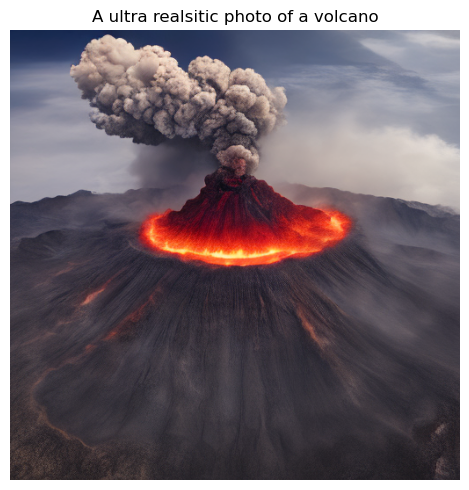

In [4]:
generative_model = GenerativeModel()

initial_seed = np.random.randn(generative_model.num_latent_variables).astype(np.half)
prompt  = "A ultra realsitic photo of a volcano"
label   = 980 # ImageNet1k index

image = generative_model(initial_seed[None, ...], prompt)[0]

fig, ax = plt.subplots()
ax.imshow(image)

ax.set(xticks=[], yticks=[])
ax.spines[['left', 'right', 'top', 'bottom']].set_visible(False)
fig.tight_layout()

fig.savefig("Image.png", dpi=300)

ax.set(title=prompt)

fig.savefig("Generated Image.png", dpi=300)

plt.show()

> Good Job Stable Diffusion! That definitely looks like a volcano! 

### <img src="../assets/icons/robot.png" alt="Classifier Model" style="height:1em;"> Setup ResNet-50 for Classification 

Let's setup ResNet-50

In [5]:
class ClassifierModel:
    
    def __init__(self, device="cuda:0"):

        self.device      = device
        
        self.model = models.resnet50(weights="IMAGENET1K_V2").to(self.device)
        self.model.eval()
        self.model = torch.jit.trace(self.model, [torch.randn(32, 3, 224, 224, device=self.device)])
    
    @torch.no_grad()
    def __call__(self, images):
        
        # Convert images to correct format for ResNet-50
        images = torch.tensor(images, device=self.device).float() 
        images /= 255.0                     # Normalize Images
        images = images.permute(0, 3, 1, 2) # Convert to (B, C, H, W) channels_first format
        
        output = self.model(images)
        logits = F.softmax(output, dim=1)
        
        return logits

Let's classify the generated image

/tmp/ipykernel_644751/1487055708.py:15: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:275.)
  images = torch.tensor(images, device=self.device).float()


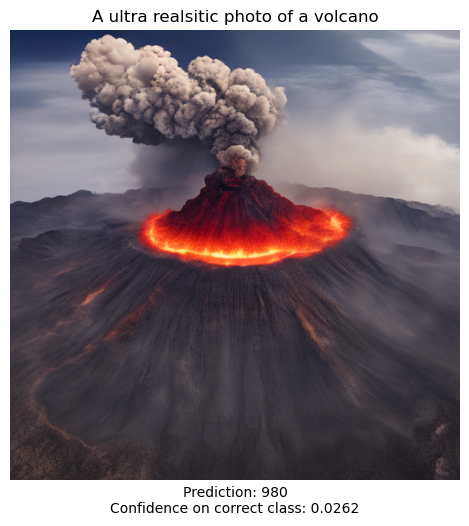

In [6]:
classifier_model = ClassifierModel()

logits = classifier_model([image])[0]

ax.set(xlabel=f"Prediction: {logits.argmax().item()}\nConfidence on correct class: {logits[label].item():.4f}")

fig.savefig("Classified Image.png", dpi=300)

fig

> Good Job ResNet! You are correct, it is a volcano!

### <img src="../assets/icons/algorithm.png" alt="Optimizer" style="height:1em;"> Setup CMA-ES for Optimization

Let's setup CMA-ES to optimize the initial seed

In [7]:
eps = 0.3
num_iterations = 500

opts = cma.CMAOptions()
opts.set("verbose", -9)

# Setup L∞ bounds for the optimizer
opts.set("bounds", [initial_seed - eps, initial_seed + eps])
        
# Setup CMA-ES
optimizer = cma.CMAEvolutionStrategy(list(initial_seed), 0.5, opts)

In [8]:
def evaluate(seeds, prompt, label):
        
    generated_images = generative_model(seeds, prompt)
    logits           = classifier_model(generated_images)
        
    preds     = logits.argmax(dim=1)
    fitnesses = logits[:, label].detach().cpu().numpy()

    return {'label': label, 'prompt': prompt, 'seeds':seeds, 'images':generated_images, 'logits': logits, 'preds': preds, 'fitnesses': fitnesses}

  0%|          | 0/1 [00:00<?, ?it/s]

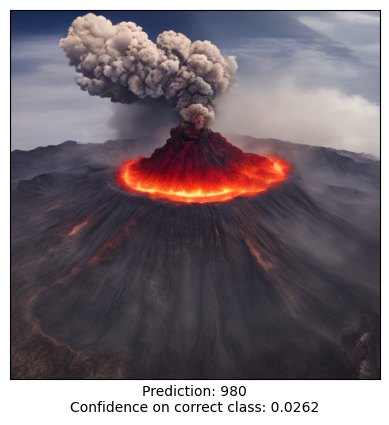

In [9]:
outputs = evaluate([initial_seed], prompt, label)

fig, ax = plt.subplots()
ax.imshow(outputs['images'][0])
ax.set(xlabel=f"Prediction: {outputs['preds'][0]}\nConfidence on correct class: {outputs['fitnesses'][0].item():.4f}")  
ax.set(xticks=[], yticks=[])        
plt.show()

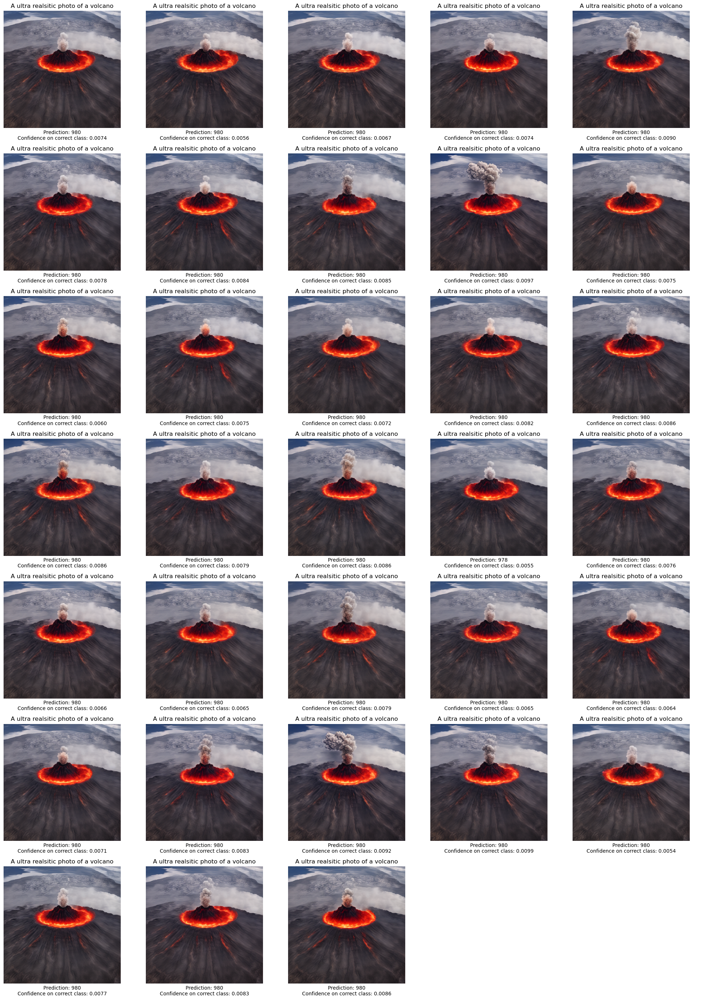

Generattions:   0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

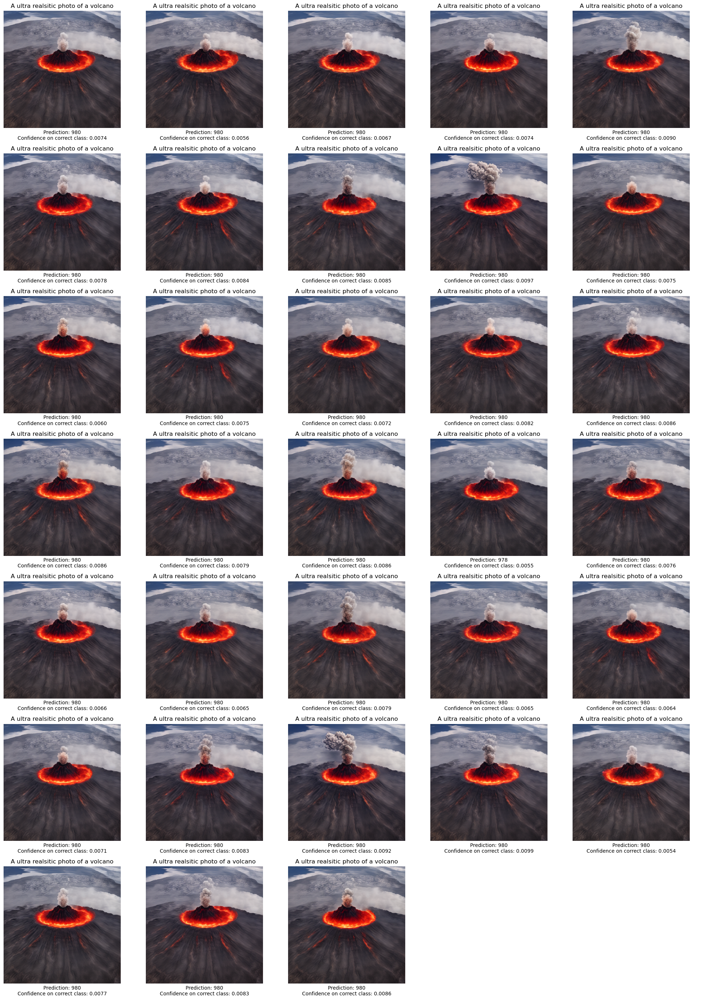

In [10]:
nc = int(np.sqrt(optimizer.popsize))
nr = int(np.ceil(optimizer.popsize/float(nc)))

fig = plt.figure(figsize=(nc*4, nr*4))
axes = fig.subplots(nr, nc)
for ax, _ in zip(axes.flat, range(optimizer.popsize)):
    ax.set(title=prompt)
    ax.set(xlabel=f"Prediction: {None}\nConfidence on correct class: {None}")

for ax in axes.flat:
    ax.set(xticks=[], yticks=[])
    ax.spines[['left', 'right', 'top', 'bottom']].set_visible(False)
    

fig.tight_layout()
    
dh = display.display(fig, display_id=True)

# Optimizing Loop in the style of Ask -> Eval -> Tell 
all_outputs = []
with tqdm(total=num_iterations, desc='Generattions') as bar:
    for i in range(num_iterations):
    
        seeds_population = np.asarray(optimizer.ask())
        
        outputs = evaluate(seeds_population, prompt, label)
        
        optimizer.tell(seeds_population, outputs['fitnesses'])
        
        all_outputs.append(outputs) 
        torch.save(all_outputs, "outputs.pt")            
        
        bar.set_postfix({"Best Fitness:": np.min(outputs['fitnesses'])})
        bar.update(1)
        
        for i, (ax, image, pred, fitness) in enumerate(zip(axes.flat, outputs['images'], outputs['preds'], outputs['fitnesses'])):
            ax.imshow(image)
            ax.set(xlabel=f"Prediction: {pred.item()}\nConfidence on correct class: {fitness.item():.4f}")
            
        checker = outputs["preds"] != outputs["label"]
        incorrect = torch.nonzero(checker).detach().cpu().numpy()
        
        if incorrect.shape[0] > 0:
            # ax = list(axes.flat)
            # for x in incorrect:
            #     ax[x].set_facecolor("#FF000064")
            dh.update(fig)
            break
                
        dh.update(fig)   

In [20]:
torch.save(all_outputs, "outputs.pt")            

In [21]:
o = torch.load("outputs.pt", map_location='cpu')

  0%|          | 0/1 [00:00<?, ?it/s]

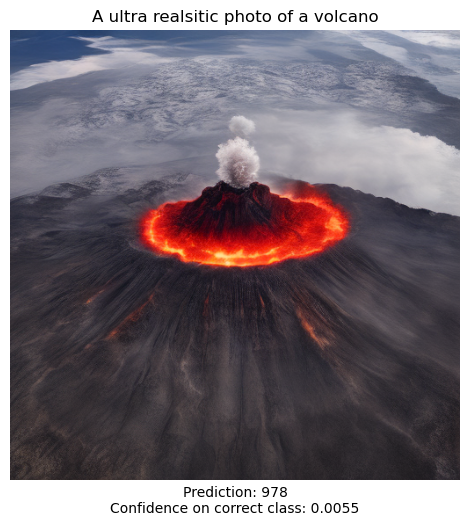

In [27]:
image = generative_model(initial_seed[None, ...], prompt)[0]

fig, ax = plt.subplots()
ax.imshow(o[-1]['images'][18])

ax.set(xticks=[], yticks=[])
ax.spines[['left', 'right', 'top', 'bottom']].set_visible(False)
fig.tight_layout()

fig.savefig("Adversarial Image.png", dpi=300)

ax.set(title=prompt)
ax.set(xlabel=f"Prediction: {o[-1]['preds'][18].item()}\nConfidence on correct class: {o[-1]['fitnesses'][18].item():.4f}")

fig.savefig("Classified Adversarial Image.png", dpi=300)

plt.show()